In [1]:
import h5py 

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import PowerNorm
from astropy.io import fits

#from radio_stats.cuts import rms_cut

from scipy.ndimage import label, maximum_filter
from scipy.spatial.distance import cdist

from natsort import natsorted
from tqdm import tqdm

In [2]:
#Anstatt radio_stats.cuts import rms_cut

def box_size(img: np.ndarray, amount_boxes: int) -> int:
    """Calculates the edge length of the calculation boxes.

    Parameters
    ----------
    img : np.ndarray, shape(N,M)
        Image to be analyzed.
    amount_boxes : int
        Amount of the boxes to be calculated.
        Needs to be quadratic number.

    Returns
    -------
    length : int
        Length of the boxes for the calculation.
    """
    if np.sqrt(amount_boxes).round(0) != np.sqrt(amount_boxes):
        raise ValueError("Amount boxes has to be a quadratic number!")
    return int(img.shape[0] / np.sqrt(amount_boxes))


def check_validity(
    img: np.ndarray, amount_boxes: int = 36, threshold: float = 1e-3
) -> np.ndarray:
    """Checks if the source is inside of the drawn boxes.
        If the source is inside the box it will be returned as False,
        otherwise as True.
        If every box cannot be used, the function recalls itself and
        doubles the threshold.

    Parameters
    ----------
    img : np.ndarray, shape(M,N)
        Image to be analyzed
    amount_boxes : int, default: 36
        Amount of the boxes to be calculated.
        Needs to be quadratic number.
    threshold : float
        Cutoff value to determine if the source is inside the box.

    Returns
    -------
    use_box : np.ndarray, shape(N,M)
        2d array of the usability of the boxes.
        If the box can be used, eg. no source in box, it will return True,
        otherwise False.
    """
    size = box_size(img, amount_boxes)
    row = int(np.sqrt(amount_boxes))
    use_box = np.zeros([row, row], dtype=bool)

    for j in range(row):
        for k in range(row):
            if np.any(
                img[size * j : size * (j + 1), size * k : size * (k + 1)] > threshold
            ):
                use_box[j, k] = False
            else:
                use_box[j, k] = True

    if np.sum(use_box) < row:
        use_box = check_validity(img, amount_boxes, threshold * 2)

    return use_box


def plot_boxes(img: np.ndarray, boxes: np.ndarray, axis=None, **kwargs):
    """Plots the boxes on top of the original image.

    Parameters
    ----------
    img : np.ndarray, shape(N,M)
        Image to be analyzed
    boxes : np.ndarray, shape(N,M)
        2d array boolean of the usability of the boxes.
    axis : `~matplotlib.axes.Axes`, optional
        Axes on which the plot should be drawn.
        If None a new figure will be created.

    Returns
    -------
    plot : `~matplotlib.image.AxesImage`
        Plot of the original image colourd with the boxes.
        Red -> box not used, Green -> box used
    """
    row = boxes.shape[0]
    size = box_size(img, row**2)
    if axis is None:
        fig, axis = plt.subplots(1, 1)
    plot = axis.imshow(img, interpolation="none", **kwargs)
    color = np.zeros(boxes.shape, dtype=str)
    color[boxes] = "g"
    color[np.invert(boxes)] = "r"
    for j in range(row):
        for k in range(row):
            axis.fill_between(
                [size * j, size * (j + 1)],
                size * k,
                size * (k + 1),
                color=color[k, j],
                alpha=0.3,
            )
    return plot


def calc_rms_boxes(img: np.ndarray, boxes: np.ndarray) -> np.ndarray:
    """Calculates the root mean square of the boxes.

    Parameters
    ----------
    img : np.ndarray, shape(N,M)
        Image to be analyzed
    boxes : np.ndarray, shape(N,M)
        2d array boolean of the usability of the boxes.

    Returns
    -------
    rms_boxes: 2d np.array
        Root mean square for each box.
        If the source is inside one box, the rms is set to -1.
    """
    row = boxes.shape[0]
    size = box_size(img, row**2)
    rms_boxes = -np.ones(boxes.shape)

    for j in range(boxes.shape[0]):
        for k in range(boxes.shape[1]):
            if not boxes[k, j]:
                continue
            else:
                rms_boxes[k, j] = np.sqrt(
                    np.mean(
                        img[k * size : (k + 1) * size, j * size : (j + 1) * size] ** 2
                    )
                )

    return rms_boxes


def rms_cut(img: np.ndarray, sigma: float = 3, verbose: bool = False, **kwargs):
    """Cuts an image using the rms.
        All values below the mean of the rms times sigma are set to zero.

    Parameters
    ----------
    img : np.ndarray, shape(N,M) or array of 2d arrays
        Images  to be analyzed
    sigma : float, default: 3.0
        Multiplier for the cut value.

    Returns
    -------
    cut_img : np.ndarray, shape(N,M) or array of 2d arrays
        Cut images.
    """
    _img = np.copy(img)
    if len(_img.shape) == 2:
        ranges = calc_rms_boxes(_img, check_validity(_img, **kwargs))
        range_img = np.mean(ranges[ranges >= 0])

        _img[_img < sigma * range_img] = 0

        return _img
    else:
        cut_img = []
        if verbose:
            img = tqdm(img)

        for pic in img:
            ranges = calc_rms_boxes(pic, check_validity(pic, **kwargs))
            range_img = np.mean(ranges[ranges >= 0])

            pic[pic < sigma * range_img] = 0
            cut_img.append(pic)

        return np.array(cut_img)

In [3]:
class SourceMatcher:
    """Match and compare point sources between simulated and reconstructed images."""
    
    def __init__(self, threshold_factor=3.0, match_radius=10.0, 
                 filter_extended=False, compactness_threshold=0.7, max_source_size=15):
        """
        Parameters:
        -----------
        threshold_factor : float
            Detection threshold as multiple of background noise
        match_radius : float
            Maximum distance (in pixels) to consider sources matched
        filter_extended : bool
            If True, filter out extended/diffuse sources and keep only compact point sources
        compactness_threshold : float
            Ratio of peak flux to total flux above which a source is considered compact (0-1)
            Higher values = more strict (only very compact sources)
        max_source_size : int
            Maximum size (in pixels) for a source to be considered point-like
        """
        self.threshold_factor = threshold_factor
        self.match_radius = match_radius
        self.filter_extended = filter_extended
        self.compactness_threshold = compactness_threshold
        self.max_source_size = max_source_size
        
        # Initialize accumulators for statistics
        self._init_accumulators()
    
    def _init_accumulators(self):
        """Initialize or reset accumulators for batch statistics."""
        self.accumulated_results = {
            'radionets': {
                'matched_count': 0,
                'total_sim_sources': 0,
                'total_recon_sources': 0,
                'unmatched_sim': 0,
                'unmatched_recon': 0,
                'peak_fluxes': {
                    'sim': np.array([]),
                    'recon': np.array([]),
                    'ratio': np.array([]),
                    'diff': np.array([]),
                    'relative_error': np.array([])
                },
                'integrated_fluxes': {
                    'sim': np.array([]),
                    'recon': np.array([]),
                    'ratio': np.array([]),
                    'diff': np.array([]),
                    'relative_error': np.array([])
                },
                'match_distances': np.array([])
            },
            'wsclean': {
                'matched_count': 0,
                'total_sim_sources': 0,
                'total_recon_sources': 0,
                'unmatched_sim': 0,
                'unmatched_recon': 0,
                'peak_fluxes': {
                    'sim': np.array([]),
                    'recon': np.array([]),
                    'ratio': np.array([]),
                    'diff': np.array([]),
                    'relative_error': np.array([])
                },
                'integrated_fluxes': {
                    'sim': np.array([]),
                    'recon': np.array([]),
                    'ratio': np.array([]),
                    'diff': np.array([]),
                    'relative_error': np.array([])
                },
                'match_distances': np.array([])
            }
        }
        self.iteration_count = 0
    
    def append_results(self, method, matches, flux_comparison):
        """
        Append results from a single iteration to the accumulated statistics.
        
        Parameters:
        -----------
        method : str
            Reconstruction method ('radionets' or 'wsclean')
        matches : dict
            Output from match_sources()
        flux_comparison : dict
            Output from compare_fluxes()
        """
        if method not in self.accumulated_results:
            raise ValueError(f"Unknown method: {method}. Use 'radionets' or 'wsclean'")
        
        if flux_comparison is None:
            return  # Skip if no matches
        
        acc = self.accumulated_results[method]
        
        # Update counters
        acc['matched_count'] += len(matches['matched_recon'])
        acc['unmatched_sim'] += len(matches['unmatched_sim'])
        acc['unmatched_recon'] += len(matches['unmatched_recon'])
        
        # Append flux data
        acc['peak_fluxes']['sim'] = np.append(
            acc['peak_fluxes']['sim'], flux_comparison['sim_peak']
        )
        acc['peak_fluxes']['recon'] = np.append(
            acc['peak_fluxes']['recon'], flux_comparison['recon_peak']
        )
        acc['peak_fluxes']['ratio'] = np.append(
            acc['peak_fluxes']['ratio'], flux_comparison['peak_ratio']
        )
        acc['peak_fluxes']['diff'] = np.append(
            acc['peak_fluxes']['diff'], flux_comparison['peak_diff']
        )
        acc['peak_fluxes']['relative_error'] = np.append(
            acc['peak_fluxes']['relative_error'], flux_comparison['peak_relative_error']
        )
        
        # Append integrated flux data
        acc['integrated_fluxes']['sim'] = np.append(
            acc['integrated_fluxes']['sim'], flux_comparison['sim_integrated']
        )
        acc['integrated_fluxes']['recon'] = np.append(
            acc['integrated_fluxes']['recon'], flux_comparison['recon_integrated']
        )
        acc['integrated_fluxes']['ratio'] = np.append(
            acc['integrated_fluxes']['ratio'], flux_comparison['integrated_ratio']
        )
        acc['integrated_fluxes']['diff'] = np.append(
            acc['integrated_fluxes']['diff'], flux_comparison['integrated_diff']
        )
        acc['integrated_fluxes']['relative_error'] = np.append(
            acc['integrated_fluxes']['relative_error'], flux_comparison['integrated_relative_error']
        )
        
        # Append match distances
        acc['match_distances'] = np.append(
            acc['match_distances'], matches['distances']
        )
    
    def get_accumulated_statistics(self, method):
        """Get compiled statistics from all accumulated results."""
        if method not in self.accumulated_results:
            raise ValueError(f"Unknown method: {method}. Use 'radionets' or 'wsclean'")
        
        acc = self.accumulated_results[method]
        
        def compute_stats(arr):
            if len(arr) == 0:
                return {
                    'values': np.array([]),
                    'mean': np.nan, 'std': np.nan, 'median': np.nan, 
                    'min': np.nan, 'max': np.nan, 'count': 0
                }
            
            valid = arr[np.isfinite(arr)]
            if len(valid) == 0:
                return {
                    'values': np.array([]),
                    'mean': np.nan, 'std': np.nan, 'median': np.nan, 
                    'min': np.nan, 'max': np.nan, 'count': 0
                }
            
            return {
                'values': valid,  # Include the actual values for plotting
                'mean': np.mean(valid),
                'std': np.std(valid),
                'median': np.median(valid),
                'min': np.min(valid),
                'max': np.max(valid),
                'count': len(valid)
            }
        
        stats = {
            'method': method,
            'iteration_count': self.iteration_count,
            'matched_count': acc['matched_count'],
            'unmatched_sim': acc['unmatched_sim'],
            'unmatched_recon': acc['unmatched_recon'],
            'peak_flux': {
                'sim': compute_stats(acc['peak_fluxes']['sim']),
                'recon': compute_stats(acc['peak_fluxes']['recon']),
                'ratio': compute_stats(acc['peak_fluxes']['ratio']),
                'diff': compute_stats(acc['peak_fluxes']['diff']),
                'relative_error': compute_stats(acc['peak_fluxes']['relative_error'])
            },
            'integrated_flux': {
                'sim': compute_stats(acc['integrated_fluxes']['sim']),
                'recon': compute_stats(acc['integrated_fluxes']['recon']),
                'ratio': compute_stats(acc['integrated_fluxes']['ratio']),
                'diff': compute_stats(acc['integrated_fluxes']['diff']),
                'relative_error': compute_stats(acc['integrated_fluxes']['relative_error'])
            },
            'match_distances': compute_stats(acc['match_distances'])
        }
        
        return stats
    
    def print_accumulated_statistics(self, method):
        """Print accumulated statistics in a readable format."""
        stats = self.get_accumulated_statistics(method)
        
        print(f"\n{'='*70}")
        print(f"ACCUMULATED STATISTICS FOR {method.upper()}")
        print(f"{'='*70}")
        print(f"Iterations processed: {stats['iteration_count']}")
        print(f"Total matched sources: {stats['matched_count']}")
        print(f"Total unmatched simulated: {stats['unmatched_sim']}")
        print(f"Total unmatched reconstructed: {stats['unmatched_recon']}")
        
        print(f"\nPEAK FLUX STATISTICS:")
        print(f"  Simulated:")
        print(f"    Mean: {stats['peak_flux']['sim']['mean']:.6f}")
        print(f"    Std:  {stats['peak_flux']['sim']['std']:.6f}")
        print(f"    Median: {stats['peak_flux']['sim']['median']:.6f}")
        print(f"  Reconstructed:")
        print(f"    Mean: {stats['peak_flux']['recon']['mean']:.6f}")
        print(f"    Std:  {stats['peak_flux']['recon']['std']:.6f}")
        print(f"    Median: {stats['peak_flux']['recon']['median']:.6f}")
        print(f"  Ratio (Recon/Sim):")
        print(f"    Mean: {stats['peak_flux']['ratio']['mean']:.4f} ± {stats['peak_flux']['ratio']['std']:.4f}")
        print(f"    Median: {stats['peak_flux']['ratio']['median']:.4f}")
        print(f"  Relative Error:")
        print(f"    Mean: {stats['peak_flux']['relative_error']['mean']:.2f}%")
        print(f"    Median: {stats['peak_flux']['relative_error']['median']:.2f}%")
        
        print(f"\nINTEGRATED FLUX STATISTICS:")
        print(f"  Simulated:")
        print(f"    Mean: {stats['integrated_flux']['sim']['mean']:.6f}")
        print(f"    Std:  {stats['integrated_flux']['sim']['std']:.6f}")
        print(f"    Median: {stats['integrated_flux']['sim']['median']:.6f}")
        print(f"  Reconstructed:")
        print(f"    Mean: {stats['integrated_flux']['recon']['mean']:.6f}")
        print(f"    Std:  {stats['integrated_flux']['recon']['std']:.6f}")
        print(f"    Median: {stats['integrated_flux']['recon']['median']:.6f}")
        print(f"  Ratio (Recon/Sim):")
        print(f"    Mean: {stats['integrated_flux']['ratio']['mean']:.4f} ± {stats['integrated_flux']['ratio']['std']:.4f}")
        print(f"    Median: {stats['integrated_flux']['ratio']['median']:.4f}")
        print(f"  Relative Error:")
        print(f"    Mean: {stats['integrated_flux']['relative_error']['mean']:.2f}%")
        print(f"    Median: {stats['integrated_flux']['relative_error']['median']:.2f}%")
        
        print(f"\nMATCH DISTANCES:")
        print(f"    Mean: {stats['match_distances']['mean']:.4f} pixels")
        print(f"    Median: {stats['match_distances']['median']:.4f} pixels")
        print(f"    Max: {stats['match_distances']['max']:.4f} pixels")
        print(f"{'='*70}\n")
    
    def reset_accumulators(self):
        """Reset all accumulators to start fresh."""
        self._init_accumulators()
    
    def _measure_compactness(self, image, x, y, peak_flux, bg_mean):
        """Measure the compactness of a source."""
        # Define aperture around source
        aperture_size = self.max_source_size
        y_min = max(0, int(y) - aperture_size)
        y_max = min(image.shape[0], int(y) + aperture_size + 1)
        x_min = max(0, int(x) - aperture_size)
        x_max = min(image.shape[1], int(x) + aperture_size + 1)
        
        # Extract cutout
        cutout = image[y_min:y_max, x_min:x_max] - bg_mean
        cutout[cutout < 0] = 0  # Remove negative pixels
        
        # Calculate total flux in aperture
        total_flux = np.sum(cutout)
        
        if total_flux == 0:
            return 0, 0
        
        # Compactness = peak / total (higher for point sources)
        compactness = peak_flux / total_flux if total_flux > 0 else 0
        
        # Calculate effective size (measure of extent)
        # Number of pixels above half maximum
        half_max_pixels = np.sum(cutout > (peak_flux * 0.5))
        
        return compactness, half_max_pixels
    
    def _measure_integrated_flux(self, image, x, y, bg_mean, aperture_radius=5):
        """Measure the integrated flux of a source within an aperture."""
        # Define circular aperture around source
        y_min = max(0, int(y) - aperture_radius)
        y_max = min(image.shape[0], int(y) + aperture_radius + 1)
        x_min = max(0, int(x) - aperture_radius)
        x_max = min(image.shape[1], int(x) + aperture_radius + 1)
        
        # Create coordinate grids
        yy, xx = np.ogrid[y_min:y_max, x_min:x_max]
        
        # Create circular mask
        distance = np.sqrt((xx - x)**2 + (yy - y)**2)
        mask = distance <= aperture_radius
        
        # Extract cutout and apply mask
        cutout = image[y_min:y_max, x_min:x_max] - bg_mean
        cutout[~mask] = 0  # Only sum within aperture
        cutout[cutout < 0] = 0  # Remove negative pixels
        
        # Sum flux within aperture
        integrated_flux = np.sum(cutout)
        
        return integrated_flux

    def apply_highpass_filter(self, image, kernel_size=101):
        """
        Apply a high-pass filter to remove diffuse emission.
        
        Parameters:
        -----------
        image : ndarray
            Input image
        kernel_size : int
            Size of the Gaussian kernel for the low-pass filter
            Larger values remove more diffuse structure
        
        Returns:
        --------
        ndarray
            High-pass filtered image (diffuse removed)
        """
        from scipy.ndimage import gaussian_filter
        
        # Create a low-pass filtered version (captures diffuse emission)
        low_pass = gaussian_filter(image, sigma=kernel_size/6)
        
        # High-pass = original - low-pass
        high_pass = image - low_pass
        
        # Clip negative values to 0
        high_pass[high_pass < 0] = 0
        
        return high_pass
    
    def detect_sources(self, image, label_name='Image', measure_integrated=True, aperture_radius=5, filter_diffuse=False, highpass_kernel=51):
        """Detect point sources in an image.
        
        Parameters:
        -----------
        image : ndarray
            Input image
        label_name : str
            Label for this image
        measure_integrated : bool
            If True, measure integrated flux in addition to peak flux
        aperture_radius : int
            Radius in pixels for integrated flux measurement
        """
        # Apply diffuse emission filter for WSClean
        if filter_diffuse:
            print(f"  Applying high-pass filter (kernel={highpass_kernel}) to remove diffuse emission...")
            image = self.apply_highpass_filter(image, kernel_size=highpass_kernel)
        # Handle NaN values
        valid_data = image[np.isfinite(image)]
        
        if len(valid_data) == 0:
            print(f"{label_name}: No valid data (all NaN)")
            return {'x': np.array([]), 'y': np.array([]), 'flux': np.array([]), 
                    'integrated_flux': np.array([]), 'n_sources': 0, 'bg_mean': 0}
        
        # Estimate background and noise using valid data only
        bg_mean = np.median(valid_data)
        
        # Use sigma-clipped statistics for better noise estimate
        # Take pixels below 75th percentile for noise estimation
        low_pixels = valid_data[valid_data < np.percentile(valid_data, 75)]
        if len(low_pixels) > 0:
            bg_std = np.std(low_pixels)
        else:
            bg_std = np.std(valid_data)
        
        # If std is 0 or very small, use a different approach
        if bg_std < 1e-10:
            bg_std = np.std(valid_data)
        
        # Threshold detection
        threshold = bg_mean + self.threshold_factor * bg_std
        
        # Create mask for valid finite values
        finite_mask = np.isfinite(image)
        mask = (image > threshold) & finite_mask
        
        # Find local maxima
        local_max = maximum_filter(image, size=3) == image
        detection_mask = mask & local_max
        
        # Get source positions and peak fluxes
        y_coords, x_coords = np.where(detection_mask)
        peak_fluxes = image[y_coords, x_coords]
        
        # Filter extended sources if requested
        if self.filter_extended and len(x_coords) > 0:
            compact_mask = np.ones(len(x_coords), dtype=bool)
            compactness_values = np.zeros(len(x_coords))
            size_values = np.zeros(len(x_coords))
            
            for i, (x, y, flux) in enumerate(zip(x_coords, y_coords, peak_fluxes)):
                compactness, size = self._measure_compactness(image, x, y, flux, bg_mean)
                compactness_values[i] = compactness
                size_values[i] = size
                
                # Keep only compact sources
                if compactness < self.compactness_threshold or size > self.max_source_size:
                    compact_mask[i] = False
            
            n_filtered = np.sum(~compact_mask)
            x_coords = x_coords[compact_mask]
            y_coords = y_coords[compact_mask]
            peak_fluxes = peak_fluxes[compact_mask]
            
            # print(f"  Filtered {n_filtered} extended sources, kept {len(x_coords)} compact sources")
        
        # Measure integrated fluxes
        integrated_fluxes = np.zeros(len(x_coords))
        if measure_integrated and len(x_coords) > 0:
            for i, (x, y) in enumerate(zip(x_coords, y_coords)):
                integrated_fluxes[i] = self._measure_integrated_flux(image, x, y, bg_mean, aperture_radius)
        
        sources = {
            'x': x_coords,
            'y': y_coords,
            'flux': peak_fluxes,
            'integrated_flux': integrated_fluxes,
            'n_sources': len(x_coords),
            'bg_mean': bg_mean
        }
        
        # print(f"{label_name}: Detected {sources['n_sources']} sources")
        # print(f"  Background: {bg_mean:.6f}, Noise: {bg_std:.6f}, Threshold: {threshold:.6f}")
        # print(f"  Image range: [{np.nanmin(image):.6f}, {np.nanmax(image):.6f}]")
        
        return sources
        
    def match_sources(self, sim_sources, recon_sources):
        """Match reconstructed sources to simulated sources."""
        if sim_sources['n_sources'] == 0 or recon_sources['n_sources'] == 0:
            return {'matched_indices': [], 'distances': [], 'unmatched_sim': [], 'unmatched_recon': []}
        
        # Create coordinate arrays
        sim_coords = np.column_stack([sim_sources['x'], sim_sources['y']])
        recon_coords = np.column_stack([recon_sources['x'], recon_sources['y']])
        
        # Calculate pairwise distances
        distances = cdist(sim_coords, recon_coords, metric='euclidean')
        
        # Match sources (greedy nearest neighbor)
        matched_sim = []
        matched_recon = []
        match_distances = []
        
        available_recon = set(range(recon_sources['n_sources']))
        
        for sim_idx in range(sim_sources['n_sources']):
            if len(available_recon) == 0:
                break
            
            # Find nearest available reconstructed source
            dist_to_available = distances[sim_idx, list(available_recon)]
            min_dist = np.min(dist_to_available)
            
            if min_dist <= self.match_radius:
                recon_idx = list(available_recon)[np.argmin(dist_to_available)]
                matched_sim.append(sim_idx)
                matched_recon.append(recon_idx)
                match_distances.append(min_dist)
                available_recon.remove(recon_idx)
        
        # Identify unmatched sources
        unmatched_sim = [i for i in range(sim_sources['n_sources']) if i not in matched_sim]
        unmatched_recon = list(available_recon)
        
        return {
            'matched_sim': matched_sim,
            'matched_recon': matched_recon,
            'distances': match_distances,
            'unmatched_sim': unmatched_sim,
            'unmatched_recon': unmatched_recon
        }
    
    def compare_fluxes(self, sim_sources, recon_sources, matches):
        """Compare peak and integrated fluxes between matched sources."""
        if len(matches['matched_sim']) == 0:
            print("Warning: No matched sources found for flux comparison")
            return None
        
        sim_peak = sim_sources['flux'][matches['matched_sim']]
        recon_peak = recon_sources['flux'][matches['matched_recon']]
        
        sim_integrated = sim_sources['integrated_flux'][matches['matched_sim']]
        recon_integrated = recon_sources['integrated_flux'][matches['matched_recon']]
        
        # Avoid division by zero
        with np.errstate(divide='ignore', invalid='ignore'):
            peak_ratio = recon_peak / sim_peak
            peak_relative_error = (recon_peak - sim_peak) / sim_peak * 100
            
            integrated_ratio = recon_integrated / sim_integrated
            integrated_relative_error = (recon_integrated - sim_integrated) / sim_integrated * 100
        
        peak_diff = recon_peak - sim_peak
        integrated_diff = recon_integrated - sim_integrated
        
        return {
            'sim_peak': sim_peak,
            'recon_peak': recon_peak,
            'peak_ratio': peak_ratio,
            'peak_diff': peak_diff,
            'peak_relative_error': peak_relative_error,
            'sim_integrated': sim_integrated,
            'recon_integrated': recon_integrated,
            'integrated_ratio': integrated_ratio,
            'integrated_diff': integrated_diff,
            'integrated_relative_error': integrated_relative_error
        }

    def plot_comparison_accumulated(self, methods=['radionets', 'wsclean']):
        """Create comprehensive comparison plots from accumulated statistics."""
        fig = plt.figure(figsize=(20, 14), layout="constrained")
        
        # Row 1: RadioNets, Row 2: WSClean
        for row, method in enumerate(methods):
            stats = self.get_accumulated_statistics(method)
            
            # Column 1: Peak flux comparison scatter plot
            ax = plt.subplot(3, 4, row*4 + 1)
            peak_flux = stats['peak_flux']
            
            ax.scatter(peak_flux['sim']['values'], peak_flux['recon']['values'], 
                      alpha=0.6, s=50)
            
            # Plot 1:1 line
            max_val = max(peak_flux['sim']['max'], peak_flux['recon']['max'])
            ax.plot([0, max_val], [0, max_val], 'r--', label='1:1 line', linewidth=2)
            
            mean_ratio = peak_flux['ratio']['mean']
            std_ratio = peak_flux['ratio']['std']
            
            ax.set_xlabel('Simulated Peak Flux')
            ax.set_ylabel('Reconstructed Peak Flux')
            ax.set_title(f'{method.capitalize()} Peak Flux Comparison\nRatio: {mean_ratio:.3f}±{std_ratio:.3f}')
            ax.legend()
            ax.grid(True, alpha=0.3)
            
            # Column 2: Integrated flux comparison scatter plot
            ax = plt.subplot(3, 4, row*4 + 2)
            int_flux = stats['integrated_flux']
            
            ax.scatter(int_flux['sim']['values'], int_flux['recon']['values'], 
                      alpha=0.6, s=50, color='purple')
            
            # Plot 1:1 line
            max_val = max(int_flux['sim']['max'], int_flux['recon']['max'])
            ax.plot([0, max_val], [0, max_val], 'r--', label='1:1 line', linewidth=2)
            
            mean_ratio = int_flux['ratio']['mean']
            std_ratio = int_flux['ratio']['std']
            
            ax.set_xlabel('Simulated Integrated Flux')
            ax.set_ylabel('Reconstructed Integrated Flux')
            ax.set_title(f'{method.capitalize()} Integrated Flux Comparison\nRatio: {mean_ratio:.3f}±{std_ratio:.3f}')
            ax.legend()
            ax.grid(True, alpha=0.3)
            
            # Column 3: Peak flux relative error histogram
            ax = plt.subplot(3, 4, row*4 + 3)
            peak_error = stats['peak_flux']['relative_error']
            
            ax.hist(peak_error['values'], bins=20, alpha=0.7, edgecolor='black', color='steelblue')
            
            mean_err = peak_error['mean']
            median_err = peak_error['median']
            std_err = peak_error['std']
            
            ax.axvline(mean_err, color='r', linestyle='--', linewidth=2, 
                      label=f'Mean: {mean_err:.1f}%')
            ax.axvline(median_err, color='g', linestyle='--', linewidth=2, 
                      label=f'Median: {median_err:.1f}%')
            ax.axvline(mean_err + std_err, color='grey', linestyle='--', linewidth=2, 
                      label=f'Std: {std_err:.1f}%')
            ax.axvline(mean_err - std_err, color='grey', linestyle='--', linewidth=2, )
            ax.axvline(0, color='k', linestyle='-', linewidth=1)
            
            ax.set_xlabel('Peak Flux Relative Error (%)')
            ax.set_ylabel('Number of Sources')
            ax.set_title(f'{method.capitalize()} Peak Flux Error Distribution')
            ax.legend(fontsize=8)
            ax.grid(True, alpha=0.3)
            
            # Column 4: Integrated flux relative error histogram
            ax = plt.subplot(3, 4, row*4 + 4)
            int_error = stats['integrated_flux']['relative_error']
            
            ax.hist(int_error['values'], bins=20, alpha=0.7, edgecolor='black', color='mediumpurple')
            
            mean_err = int_error['mean']
            median_err = int_error['median']
            std_err = int_error['std']
            
            ax.axvline(mean_err, color='r', linestyle='--', linewidth=2, 
                      label=f'Mean: {mean_err:.1f}%')
            ax.axvline(median_err, color='g', linestyle='--', linewidth=2, 
                      label=f'Median: {median_err:.1f}%')
            ax.axvline(mean_err + std_err, color='grey', linestyle='--', linewidth=2, 
                      label=f'Std: {std_err:.1f}%')
            ax.axvline(mean_err - std_err, color='grey', linestyle='--', linewidth=2, )

            ax.axvline(0, color='k', linestyle='-', linewidth=1)
            
            ax.set_xlabel('Integrated Flux Relative Error (%)')
            ax.set_ylabel('Number of Sources')
            ax.set_title(f'{method.capitalize()} Integrated Flux Error Distribution')
            ax.legend(fontsize=8)
            ax.grid(True, alpha=0.3)
        
        # ==================== ROW 3: IMPROVED STYLING ====================
        
        # Define colors for each method
        colors = {'radionets': '#1f77b4', 'wsclean': '#ff7f0e'}
        
        # Plot 1: Peak Flux Ratio Distribution (Better styling)
        ax = plt.subplot(3, 4, 9)
        for method in methods:
            stats = self.get_accumulated_statistics(method)
            peak_ratio = stats['peak_flux']['ratio']
            mean_val = peak_ratio['mean']
            std_val = peak_ratio['std']
            
            ax.hist(peak_ratio['values'], bins=25, label=method.capitalize(), 
                   linewidth=1.2, color=colors[method], histtype="step")
            
            # Add vertical line for mean
            ax.axvline(mean_val, color=colors[method], linestyle='--', linewidth=2.5, 
                      label=f'{method.capitalize()}: {mean_val:.3f}±{std_val:.3f}')
        
        ax.axvline(1.0, color='red', linestyle='-', linewidth=2.5, label='Perfect Match (1.0)', zorder=5)
        ax.set_xlabel('Peak Flux Ratio (Reconstructed / Simulated)', fontsize=11, fontweight='bold')
        ax.set_ylabel('Number of Sources', fontsize=11, fontweight='bold')
        ax.set_title('Peak Flux Ratio Distribution', fontsize=12, fontweight='bold')
        ax.legend(fontsize=9, loc='upper right', framealpha=0.95)
        ax.grid(True, alpha=0.3, linestyle='--')
        ax.set_axisbelow(True)
        
        # Plot 2: Integrated Flux Ratio Distribution (Better styling)
        ax = plt.subplot(3, 4, 10)
        for method in methods:
            stats = self.get_accumulated_statistics(method)
            int_ratio = stats['integrated_flux']['ratio']
            mean_val = int_ratio['mean']
            std_val = int_ratio['std']
            
            ax.hist(int_ratio['values'], bins=25, label=method.capitalize(), 
                   linewidth=1.2, color=colors[method], histtype="step")
            
            # Add vertical line for mean
            ax.axvline(mean_val, color=colors[method], linestyle='--', linewidth=2.5, 
                      label=f'{method.capitalize()}: {mean_val:.3f}±{std_val:.3f}')
        
        ax.axvline(1.0, color='red', linestyle='-', linewidth=2.5, label='Perfect Match (1.0)', zorder=5)
        ax.set_xlabel('Integrated Flux Ratio (Reconstructed / Simulated)', fontsize=11, fontweight='bold')
        ax.set_ylabel('Number of Sources', fontsize=11, fontweight='bold')
        ax.set_title('Integrated Flux Ratio Distribution', fontsize=12, fontweight='bold')
        ax.legend(fontsize=9, loc='upper right', framealpha=0.95)
        ax.grid(True, alpha=0.3, linestyle='--')
        ax.set_axisbelow(True)
        
        # Plot 3: Match Distance Distribution (Better styling)
        ax = plt.subplot(3, 4, 11)
        for method in methods:
            stats = self.get_accumulated_statistics(method)
            match_dist = stats['match_distances']
            mean_val = match_dist['mean']
            median_val = match_dist['median']
            
            ax.hist(match_dist['values'], bins=25, label=method.capitalize(), 
                   linewidth=1.2, color=colors[method], histtype="step")
            
            # Add vertical lines for mean and median
            ax.axvline(mean_val, color=colors[method], linestyle='--', linewidth=2, 
                      label=f'{method.capitalize()} Mean: {mean_val:.2f}')
        
        ax.set_xlabel('Match Distance (pixels)', fontsize=11, fontweight='bold')
        ax.set_ylabel('Number of Matches', fontsize=11, fontweight='bold')
        ax.set_title('Source Match Distance Distribution', fontsize=12, fontweight='bold')
        ax.legend(fontsize=9, loc='upper right', framealpha=0.95)
        ax.grid(True, alpha=0.3, linestyle='--')
        ax.set_axisbelow(True)
        
        # Plot 4: Enhanced Summary Statistics Table
        ax = plt.subplot(3, 4, 12)
        ax.axis('off')
        
        # Create a more visually appealing statistics display
        stats_text = ""
        
        for method in methods:
            stats = self.get_accumulated_statistics(method)
            
            # Color-coded header
            stats_text += f"\n{'█' * 50}\n"
            stats_text += f"  {method.upper()} - ACCUMULATED STATISTICS\n"
            stats_text += f"{'█' * 50}\n\n"
            
            stats_text += f"Processing:\n"
            stats_text += f"  • Iterations: {stats['iteration_count']}\n"
            stats_text += f"  • Matched: {stats['matched_count']}\n"
            stats_text += f"  • Unmatched (Sim/Recon): {stats['unmatched_sim']}/{stats['unmatched_recon']}\n\n"
            
            stats_text += f"Peak Flux:\n"
            stats_text += f"  • Ratio: {stats['peak_flux']['ratio']['mean']:.4f} ± {stats['peak_flux']['ratio']['std']:.4f}\n"
            stats_text += f"  • Error: {stats['peak_flux']['relative_error']['mean']:.2f}% ± {stats['peak_flux']['relative_error']['std']:.2f}%\n"
            stats_text += f"  • Median Error: {stats['peak_flux']['relative_error']['median']:.2f}%\n\n"
            
            stats_text += f"Integrated Flux:\n"
            stats_text += f"  • Ratio: {stats['integrated_flux']['ratio']['mean']:.4f} ± {stats['integrated_flux']['ratio']['std']:.4f}\n"
            stats_text += f"  • Error: {stats['integrated_flux']['relative_error']['mean']:.2f}% ± {stats['integrated_flux']['relative_error']['std']:.2f}%\n"
            stats_text += f"  • Median Error: {stats['integrated_flux']['relative_error']['median']:.2f}%\n\n"
            
            stats_text += f"Match Distance:\n"
            stats_text += f"  • Mean: {stats['match_distances']['mean']:.3f} pixels\n"
            stats_text += f"  • Median: {stats['match_distances']['median']:.3f} pixels\n"
            stats_text += f"  • Max: {stats['match_distances']['max']:.3f} pixels\n"
        
        ax.text(0.05, 0.95, stats_text, transform=ax.transAxes, 
               fontsize=9, verticalalignment='top', fontfamily='monospace',
               bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.3, pad=1))
        
        plt.show()
        
        return fig

In [4]:
from pathlib import Path

def find_files(directory, phrase):
    directory = Path(directory)
    return natsorted([file for file in directory.glob('*') if phrase in file.name])

def open_radionets(path):
    f_reco = h5py.File(path)
    reco = np.array(f_reco["reco"])
    return rms_cut(reco, 5), reco

def open_wsclean(path):
    f_wsclean = fits.open(path)
    reco_ws = f_wsclean[0].data[0, 0][::-1]
    return rms_cut(reco_ws, 5), reco_ws

def open_sim(path):
    f_sim = h5py.File(path)
    return np.array(f_sim["sky"])[0], np.array(f_sim["sky"])[1]

In [5]:
files_radionets = find_files("/hs/babbage/data/group-brueggen/David/diff.clean_rekonstruktion/twoopt_unbinned_new_loss", "eval")
files_wsclean = find_files("/hs/babbage/data/shared/eval_data/wsclean/", "image")
files_dirty = find_files("/hs/babbage/data/shared/eval_data/wsclean", "dirty")
files_sim = find_files("/hs/babbage/data/shared/eval_data/h5", "valid")

In [6]:
# Initialize matcher for simulation and RadioNets (no filtering)
matcher = SourceMatcher(threshold_factor=3.0, match_radius=10.0)

# Create visualization
sources_dict = {'simulation': [], 'radionets': [], 'wsclean': []}
matches_dict = {'radionets': [], 'wsclean': []}
flux_comp_dict = {'radionets': [], 'wsclean': []}

for i in range(100):
    print(i)
    f_radio = files_radionets[i]
    f_ws = files_wsclean[i]
    f_sim = files_sim[i]

    reco,_ = open_radionets(f_radio)
    reco = reco[0,0,...]
    reco_ws,_ = open_wsclean(f_ws)
    sky_sim,_ = open_sim(f_sim)
    
    # Detect sources in simulation and RadioNets
    sim_sources = matcher.detect_sources(sky_sim, label_name=f'Simulation {i}')
    radio_sources = matcher.detect_sources(reco, label_name=f'radionets {i}')
    ws_sources = matcher.detect_sources(reco_ws, filter_diffuse=True, label_name=f'wsclean {i}', highpass_kernel=201)
    
    # Match sources using the regular matcher
    radio_matches = matcher.match_sources(sim_sources, radio_sources)
    ws_matches = matcher.match_sources(sim_sources, ws_sources)
    
    # Match sources
    radio_matches = matcher.match_sources(sim_sources, radio_sources)
    ws_matches = matcher.match_sources(sim_sources, ws_sources)
    
    # Compare fluxes
    radio_flux_comp = matcher.compare_fluxes(sim_sources, radio_sources, radio_matches)
    try:
        ws_flux_comp = matcher.compare_fluxes(sim_sources, ws_sources, ws_matches)
        matcher.append_results('wsclean', ws_matches, ws_flux_comp)
    except KeyError:
        pass

    # Append results to accumulator
    matcher.append_results('radionets', radio_matches, radio_flux_comp)
    
    matcher.iteration_count += 1

# Print accumulated statistics
matcher.print_accumulated_statistics('radionets')
matcher.print_accumulated_statistics('wsclean')

# Get statistics as a dictionary for further processing
stats = matcher.get_accumulated_statistics('radionets')


    # sources_dict["simulation"].append(sim_sources)
    # sources_dict["radionets"].append(radio_sources)
    # sources_dict["wsclean"].append(ws_sources)
    
    # matches_dict["radionets"].append(radio_matches)
    # matches_dict["wsclean"].append(ws_matches)
    
    # flux_comp_dict["radionets"].append(radio_flux_comp)
    # flux_comp_dict["wsclean"].append(ws_flux_comp)

0


/tmp/ipykernel_141002/2510480725.py:9: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.
  reco = np.array(f_reco["reco"])
/hs/babbage/data/group-brueggen/David/miniconda3/envs/diffclean3/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:3904: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/hs/babbage/data/group-brueggen/David/miniconda3/envs/diffclean3/lib/python3.10/site-packages/numpy/_core/_methods.py:147: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)
/hs/babbage/data/group-brueggen/David/miniconda3/envs/diffclean3/lib/python3.10/site-packages/numpy/_core/_methods.py:147: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/tmp/ipykernel_141002/2510480725.py:19: DeprecationWarning: __array__ implementation doesn't accept a copy keywo

  Applying high-pass filter (kernel=201) to remove diffuse emission...
1
  Applying high-pass filter (kernel=201) to remove diffuse emission...
2
  Applying high-pass filter (kernel=201) to remove diffuse emission...
3
  Applying high-pass filter (kernel=201) to remove diffuse emission...
4
  Applying high-pass filter (kernel=201) to remove diffuse emission...
5
  Applying high-pass filter (kernel=201) to remove diffuse emission...
6
  Applying high-pass filter (kernel=201) to remove diffuse emission...
7
  Applying high-pass filter (kernel=201) to remove diffuse emission...
8
  Applying high-pass filter (kernel=201) to remove diffuse emission...
9
  Applying high-pass filter (kernel=201) to remove diffuse emission...
10
  Applying high-pass filter (kernel=201) to remove diffuse emission...
11
  Applying high-pass filter (kernel=201) to remove diffuse emission...
12
  Applying high-pass filter (kernel=201) to remove diffuse emission...
13
  Applying high-pass filter (kernel=201) to rem

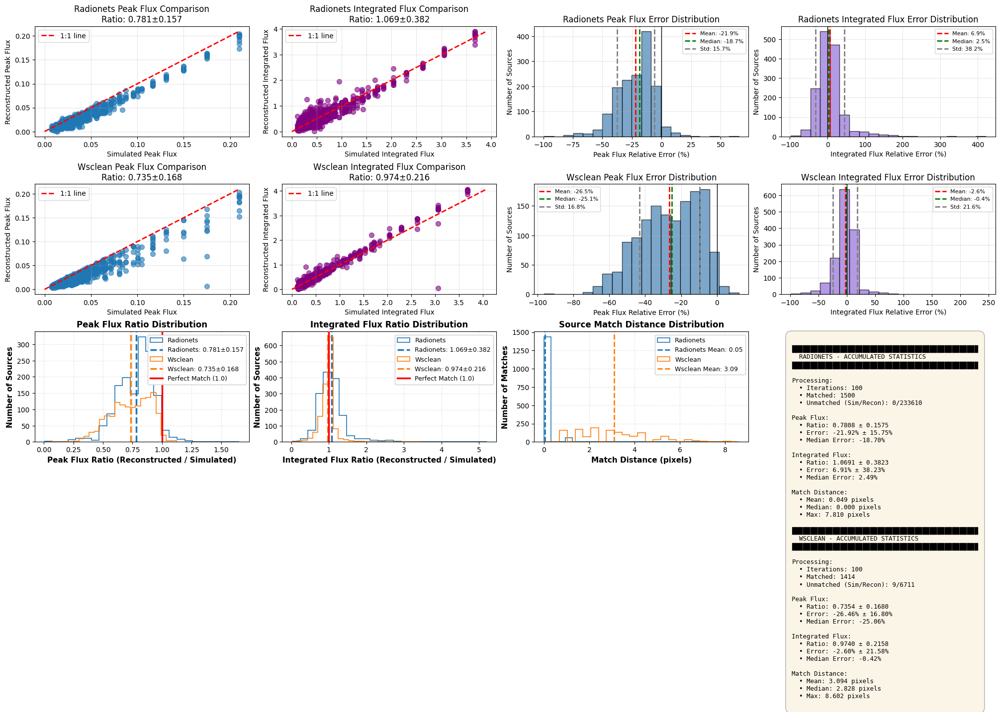

In [7]:
fig = matcher.plot_comparison_accumulated(methods=['radionets', 'wsclean'])
fig.savefig("point_sources_evaluation.pdf")

# Diffuse Emission


0
SSIM Index Reco: 0.9443724155426025
SSIM Index WSClean: 0.8542421460151672
SSIM Index Dirty: 0.4398581385612488
L1 Loss Reco: 0.00013665968435816467
L1 Loss WSClean: 0.00033180645550601184
L1 Loss Dirty: 0.0009336186922155321
NCC Reco: 0.9353505969047546
NCC WSClean: 0.5914494395256042
NCC Dirty: 0.4016684591770172
1
SSIM Index Reco: 0.9764420986175537
SSIM Index WSClean: 0.8503763675689697
SSIM Index Dirty: 0.5935356616973877
L1 Loss Reco: 0.0002824385301209986
L1 Loss WSClean: 0.0010126387933269143
L1 Loss Dirty: 0.0021937419660389423
NCC Reco: 0.9617262482643127
NCC WSClean: 0.6009002327919006
NCC Dirty: 0.4262816607952118
2
SSIM Index Reco: 0.8095111846923828
SSIM Index WSClean: 0.6317277550697327
SSIM Index Dirty: 0.3338899314403534
L1 Loss Reco: 0.0004019996849820018
L1 Loss WSClean: 0.0005878900992684066
L1 Loss Dirty: 0.0010520715732127428
NCC Reco: 0.8302132487297058
NCC WSClean: 0.6346256732940674
NCC Dirty: 0.34757837653160095
3


/tmp/ipykernel_141002/2510480725.py:9: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.
  reco = np.array(f_reco["reco"])
/hs/babbage/data/group-brueggen/David/miniconda3/envs/diffclean3/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:3904: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/hs/babbage/data/group-brueggen/David/miniconda3/envs/diffclean3/lib/python3.10/site-packages/numpy/_core/_methods.py:147: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)
/hs/babbage/data/group-brueggen/David/miniconda3/envs/diffclean3/lib/python3.10/site-packages/numpy/_core/_methods.py:147: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/tmp/ipykernel_141002/2510480725.py:19: DeprecationWarning: __array__ implementation doesn't accept a copy keywo

SSIM Index Reco: 0.9847321510314941
SSIM Index WSClean: 0.9207829236984253
SSIM Index Dirty: 0.4887222945690155
L1 Loss Reco: 0.00012329875607974827
L1 Loss WSClean: 0.00042194011621177197
L1 Loss Dirty: 0.0016123211244121194
NCC Reco: 0.9705222845077515
NCC WSClean: 0.8015763163566589
NCC Dirty: 0.48812079429626465
4
SSIM Index Reco: 0.9685065746307373
SSIM Index WSClean: 0.8861635327339172
SSIM Index Dirty: 0.676121711730957
L1 Loss Reco: 0.00032568658934906125
L1 Loss WSClean: 0.0007905802922323346
L1 Loss Dirty: 0.001730036921799183
NCC Reco: 0.9348986148834229
NCC WSClean: 0.5902999639511108
NCC Dirty: 0.4282914996147156
5
SSIM Index Reco: 0.9333271384239197
SSIM Index WSClean: 0.655880868434906
SSIM Index Dirty: 0.3311273157596588
L1 Loss Reco: 0.0004284209571778774
L1 Loss WSClean: 0.0011145113967359066
L1 Loss Dirty: 0.0022419807501137257
NCC Reco: 0.9427136778831482
NCC WSClean: 0.4992859363555908
NCC Dirty: 0.4033564627170563
6
SSIM Index Reco: 0.9684802889823914
SSIM Index W

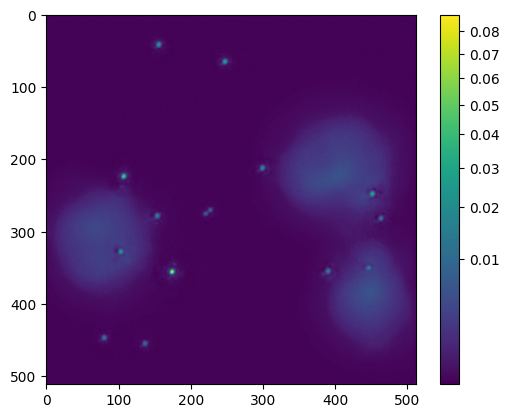

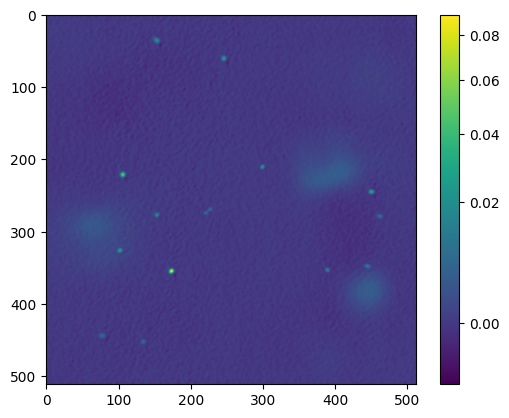

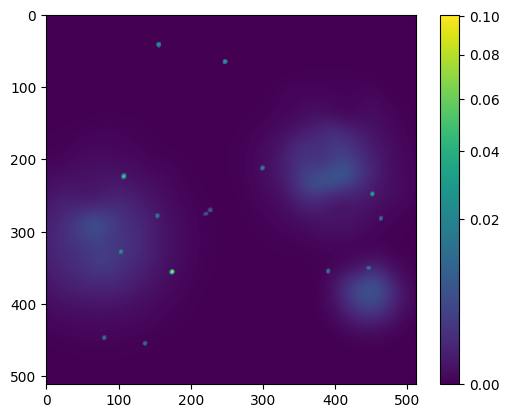

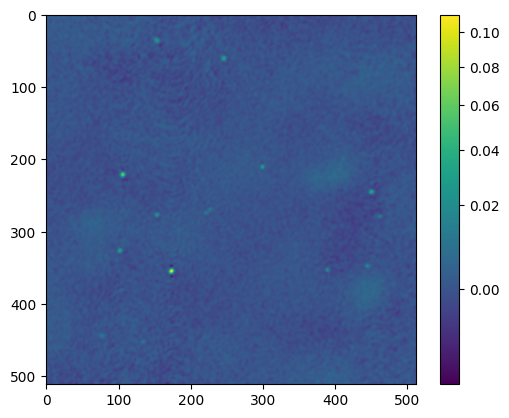

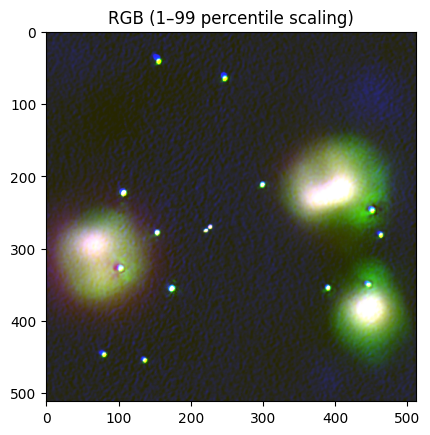

In [8]:
import torch
from torch.nn import L1Loss

def normalized_cross_correlation(img1, img2):
    """Compute normalized cross-correlation between two images."""
    img1_mean = torch.mean(img1)
    img2_mean = torch.mean(img2)
    numerator = torch.sum((img1 - img1_mean) * (img2 - img2_mean))
    denominator = torch.sqrt(torch.sum((img1 - img1_mean) ** 2) * torch.sum((img2 - img2_mean) ** 2))
    return numerator / denominator if denominator != 0 else 0

ssim_reco_list = []
ssim_ws_list = []
l1_reco_list = []
l1_ws_list = []
l1_dirty_list = []
ncc_reco_list = []
ncc_ws_list = []
ncc_dirty_list = []
for i in range(100):
    print(i)
    f_radio = files_radionets[i]
    f_ws = files_wsclean[i]
    f_sim = files_sim[i]
    f_dirty = files_dirty[i]

    _,reco = open_radionets(f_radio)
    reco = reco[0,0,...]
    _, reco_ws = open_wsclean(f_ws)
    _, dirty = open_wsclean(f_dirty)
    reco_ws= np.asarray(reco_ws, dtype=np.float32)
    dirty= np.asarray(dirty, dtype=np.float32)
    points, diffuse = open_sim(f_sim)
    sky_sim = points + diffuse
    if i==0:
        reco_arr = reco[np.newaxis, ...]
        reco_ws_arr = reco_ws[np.newaxis, ...]
        sky_sim_arr = sky_sim[np.newaxis, ...]
        dirty_arr = dirty[np.newaxis, ...]
    else:
        reco_arr = np.concatenate((reco_arr, reco[np.newaxis, ...]), axis=0)
        reco_ws_arr = np.concatenate((reco_ws_arr, reco_ws[np.newaxis, ...]), axis=0)
        sky_sim_arr = np.concatenate((sky_sim_arr, sky_sim[np.newaxis, ...]), axis=0)
        dirty_arr = np.concatenate((dirty_arr, dirty[np.newaxis, ...]), axis=0)
    from pytorch_msssim import ssim
    ssim_reco = ssim(torch.tensor(sky_sim, dtype=torch.float).unsqueeze(0).unsqueeze(0), torch.tensor(reco,dtype=torch.float).unsqueeze(0).unsqueeze(0), data_range=torch.tensor(sky_sim, dtype=torch.float).max().item(), size_average=True)
    ssim_ws = ssim(torch.tensor(sky_sim, dtype=torch.float).unsqueeze(0).unsqueeze(0), torch.tensor(reco_ws,dtype=torch.float).unsqueeze(0).unsqueeze(0), data_range=torch.tensor(sky_sim, dtype=torch.float).max().item(), size_average=True)
    ssim_dirty = ssim(torch.tensor(sky_sim, dtype=torch.float).unsqueeze(0).unsqueeze(0), torch.tensor(dirty,dtype=torch.float).unsqueeze(0).unsqueeze(0), data_range=torch.tensor(sky_sim, dtype=torch.float).max().item(), size_average=True)
    print("SSIM Index Reco:", ssim_reco.item())
    print("SSIM Index WSClean:", ssim_ws.item())
    print("SSIM Index Dirty:", ssim_dirty.item())
    l1_reco = L1Loss()(torch.tensor(sky_sim, dtype=torch.float).unsqueeze(0).unsqueeze(0), torch.tensor(reco,dtype=torch.float).unsqueeze(0).unsqueeze(0))
    l1_ws = L1Loss()(torch.tensor(sky_sim, dtype=torch.float).unsqueeze(0).unsqueeze(0), torch.tensor(reco_ws,dtype=torch.float).unsqueeze(0).unsqueeze(0))
    l1_dirty = L1Loss()(torch.tensor(sky_sim, dtype=torch.float).unsqueeze(0).unsqueeze(0), torch.tensor(dirty,dtype=torch.float).unsqueeze(0).unsqueeze(0))
    print("L1 Loss Reco:", l1_reco.item())
    print("L1 Loss WSClean:", l1_ws.item())
    print("L1 Loss Dirty:", l1_dirty.item())
    ncc_reco = normalized_cross_correlation(torch.tensor(sky_sim, dtype=torch.float), torch.tensor(reco,dtype=torch.float))
    ncc_ws = normalized_cross_correlation(torch.tensor(sky_sim, dtype=torch.float), torch.tensor(reco_ws,dtype=torch.float))
    ncc_dirty = normalized_cross_correlation(torch.tensor(sky_sim, dtype=torch.float), torch.tensor(dirty,dtype=torch.float))
    print("NCC Reco:", ncc_reco.item())
    print("NCC WSClean:", ncc_ws.item())
    print("NCC Dirty:", ncc_dirty.item())
    ssim_reco_list.append(ssim_reco.item())
    ssim_ws_list.append(ssim_ws.item())
    l1_reco_list.append(l1_reco.item())
    l1_ws_list.append(l1_ws.item())
    l1_dirty_list.append(l1_dirty.item())
    ncc_reco_list.append(ncc_reco.item())
    ncc_ws_list.append(ncc_ws.item())
    ncc_dirty_list.append(ncc_dirty.item())
    if i ==99:
        plt.imshow(reco, norm=PowerNorm(0.5))
        plt.colorbar()
        plt.show()
        plt.imshow(reco_ws, norm=PowerNorm(0.5))
        plt.colorbar()
        plt.show()
        plt.imshow(sky_sim, norm=PowerNorm(0.5))
        plt.colorbar()
        plt.show()
        plt.imshow(dirty, norm=PowerNorm(0.5))
        plt.colorbar()
        plt.show()
        
        stack = np.stack([reco, reco_ws, sky_sim])

        vmin = np.percentile(stack, 1)
        vmax = np.percentile(stack, 99)

        def normalize(x):
            return np.clip((x - vmin) / (vmax - vmin), 0, 1)

        rgb = np.stack([
            normalize(sky_sim),  # R
            normalize(reco),     # G
            normalize(reco_ws)   # B
        ], axis=-1)

        #plt.figure(figsize=(6, 6))
        plt.imshow(rgb)
        plt.title("RGB (1–99 percentile scaling)")
        plt.show()


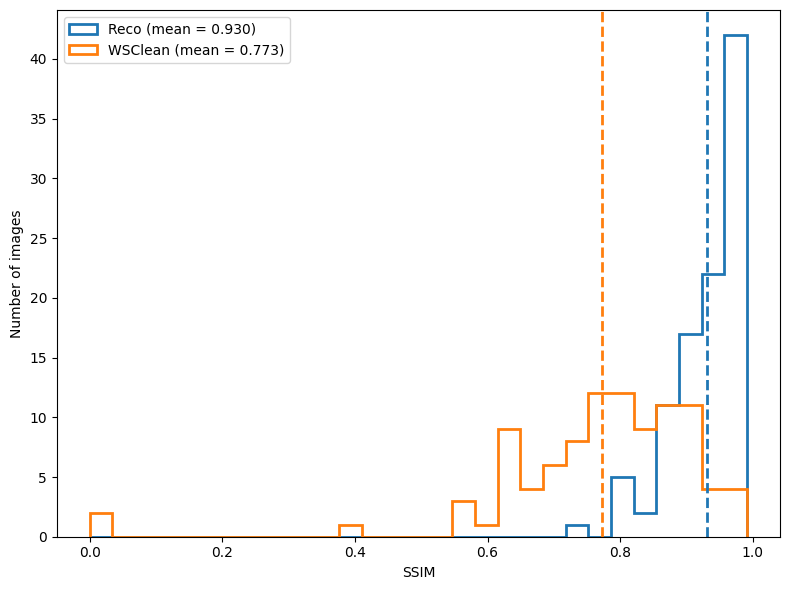

In [9]:

ssim_reco_arr = np.array(ssim_reco_list, dtype=float)
ssim_ws_arr = np.array(ssim_ws_list, dtype=float)

# NaNs entfernen
ssim_reco_arr = ssim_reco_arr[np.isfinite(ssim_reco_arr)]
ssim_ws_arr = ssim_ws_arr[np.isfinite(ssim_ws_arr)]

mean_reco = ssim_reco_arr.mean()
mean_ws = ssim_ws_arr.mean()

# Gemeinsame Bins (gleich breit!)
xmin = min(ssim_reco_arr.min(), ssim_ws_arr.min())
xmax = max(ssim_reco_arr.max(), ssim_ws_arr.max())
bins = np.linspace(xmin, xmax, 30)   # lieber etwas feiner als 20

# Farben explizit setzen
color_reco = "tab:blue"
color_ws = "tab:orange"

plt.figure(figsize=(8, 6))

plt.hist(
    ssim_reco_arr,
    bins=bins,
    histtype="step",
    linewidth=2,
    color=color_reco,
    label=f"Reco (mean = {mean_reco:.3f})"
)

plt.hist(
    ssim_ws_arr,
    bins=bins,
    histtype="step",
    linewidth=2,
    color=color_ws,
    label=f"WSClean (mean = {mean_ws:.3f})"
)

# Mean-Linien in gleicher Farbe
plt.axvline(mean_reco, linestyle="--", linewidth=2, color=color_reco)
plt.axvline(mean_ws, linestyle="--", linewidth=2, color=color_ws)

plt.xlabel("SSIM")
plt.ylabel("Number of images")
plt.legend()
plt.tight_layout()
plt.show()

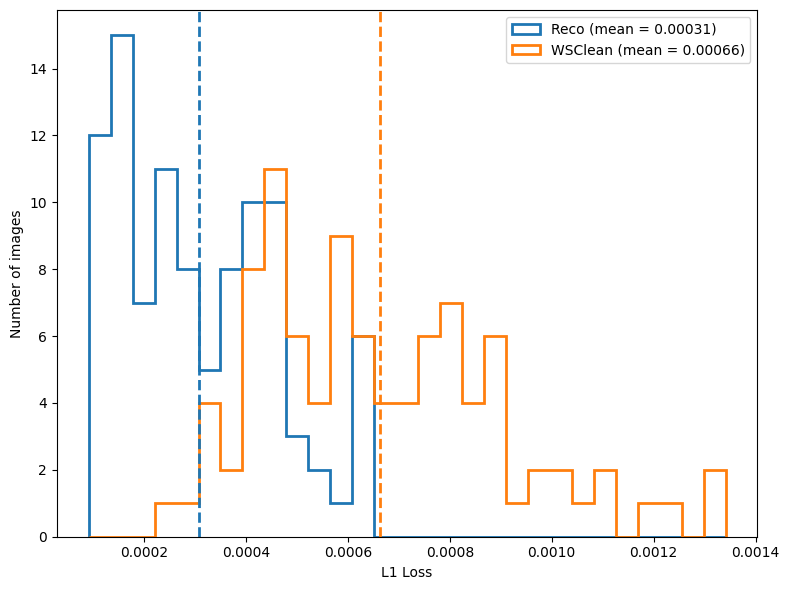

In [10]:
l1_reco_arr = np.array(l1_reco_list, dtype=float)
l1_ws_arr = np.array(l1_ws_list, dtype=float)

# NaNs entfernen
l1_reco_arr = l1_reco_arr[np.isfinite(l1_reco_arr)]
l1_ws_arr = l1_ws_arr[np.isfinite(l1_ws_arr)]


mean_reco = l1_reco_arr.mean()
mean_ws = l1_ws_arr.mean()

l1_reco_arr = l1_reco_arr[l1_reco_arr <= np.percentile(l1_reco_arr, 98)]
l1_ws_arr = l1_ws_arr[l1_ws_arr <= np.percentile(l1_ws_arr, 98)]

mean_reco = l1_reco_arr.mean()
mean_ws = l1_ws_arr.mean()

# Gemeinsame Bins (gleich breit!)
xmin = min(l1_reco_arr.min(), l1_ws_arr.min())
xmax = max(l1_reco_arr.max(), l1_ws_arr.max())
bins = np.linspace(xmin, xmax, 30)   # lieber etwas feiner als 20

# Farben explizit setzen
color_reco = "tab:blue"
color_ws = "tab:orange"

plt.figure(figsize=(8, 6))

plt.hist(
    l1_reco_arr,
    bins=bins,
    histtype="step",
    linewidth=2,
    color=color_reco,
    label=f"Reco (mean = {mean_reco:.5f})"
)

plt.hist(
    l1_ws_arr,
    bins=bins,
    histtype="step",
    linewidth=2,
    color=color_ws,
    label=f"WSClean (mean = {mean_ws:.5f})"
)

# Mean-Linien in gleicher Farbe
plt.axvline(mean_reco, linestyle="--", linewidth=2, color=color_reco)
plt.axvline(mean_ws, linestyle="--", linewidth=2, color=color_ws)

plt.xlabel("L1 Loss")
plt.ylabel("Number of images")
plt.legend()
plt.tight_layout()
plt.show()

## NCC
https://xcdskd.readthedocs.io/en/latest/cross_correlation/cross_correlation_coefficient.html

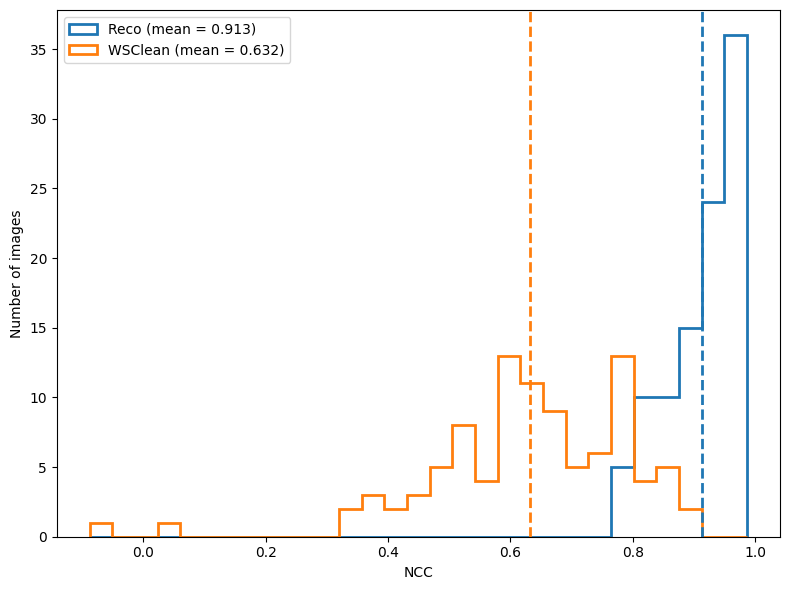

In [11]:
ncc_reco_arr = np.array(ncc_reco_list, dtype=float)
ncc_ws_arr = np.array(ncc_ws_list, dtype=float)

# NaNs entfernen
ncc_reco_arr = ncc_reco_arr[np.isfinite(ncc_reco_arr)]
ncc_ws_arr = ncc_ws_arr[np.isfinite(ncc_ws_arr)]

mean_reco = ncc_reco_arr.mean()
mean_ws = ncc_ws_arr.mean()

# Gemeinsame Bins (gleich breit!)
xmin = min(ncc_reco_arr.min(), ncc_ws_arr.min())
xmax = max(ncc_reco_arr.max(), ncc_ws_arr.max())
bins = np.linspace(xmin, xmax, 30)   # lieber etwas feiner als 20

# Farben explizit setzen
color_reco = "tab:blue"
color_ws = "tab:orange"

plt.figure(figsize=(8, 6))

plt.hist(
    ncc_reco_arr,
    bins=bins,
    histtype="step",
    linewidth=2,
    color=color_reco,
    label=f"Reco (mean = {mean_reco:.3f})"
)

plt.hist(
    ncc_ws_arr,
    bins=bins,
    histtype="step",
    linewidth=2,
    color=color_ws,
    label=f"WSClean (mean = {mean_ws:.3f})"
)

# Mean-Linien in gleicher Farbe
plt.axvline(mean_reco, linestyle="--", linewidth=2, color=color_reco)
plt.axvline(mean_ws, linestyle="--", linewidth=2, color=color_ws)

plt.xlabel("NCC")
plt.ylabel("Number of images")
plt.legend()
plt.tight_layout()
plt.show()

## Kontouren und Farbplots

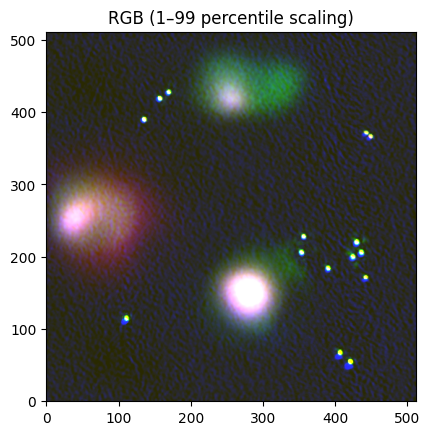

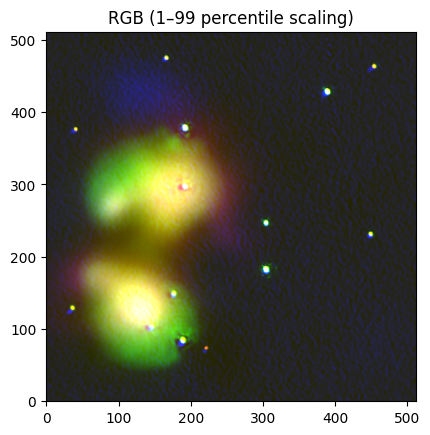

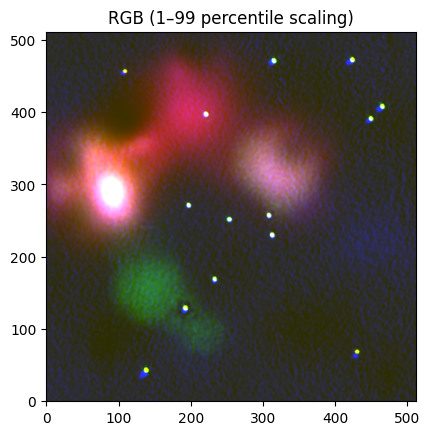

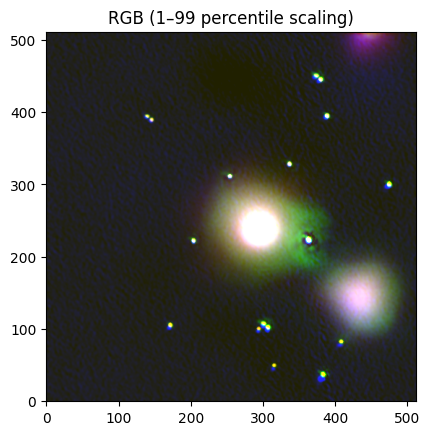

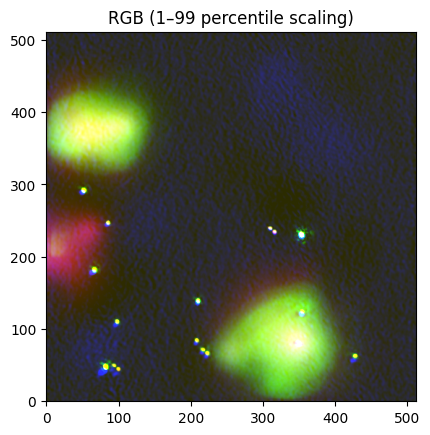

...

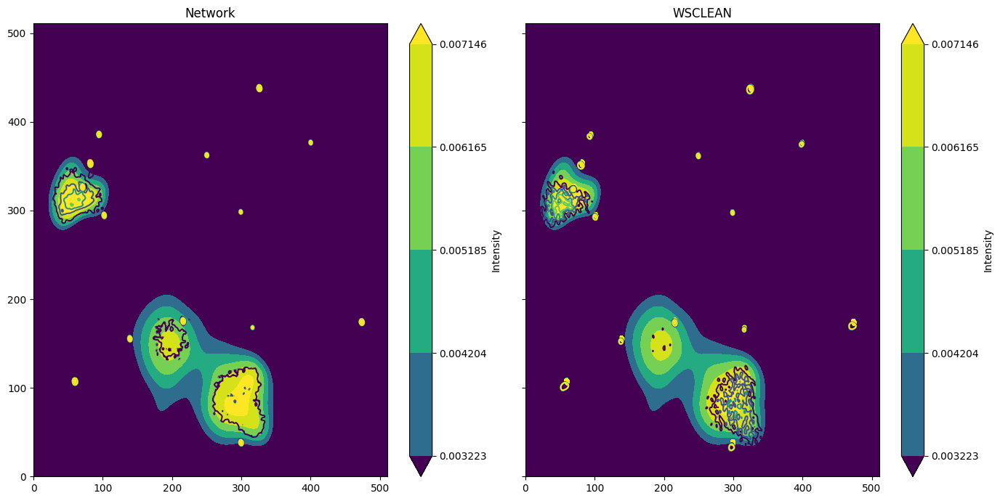

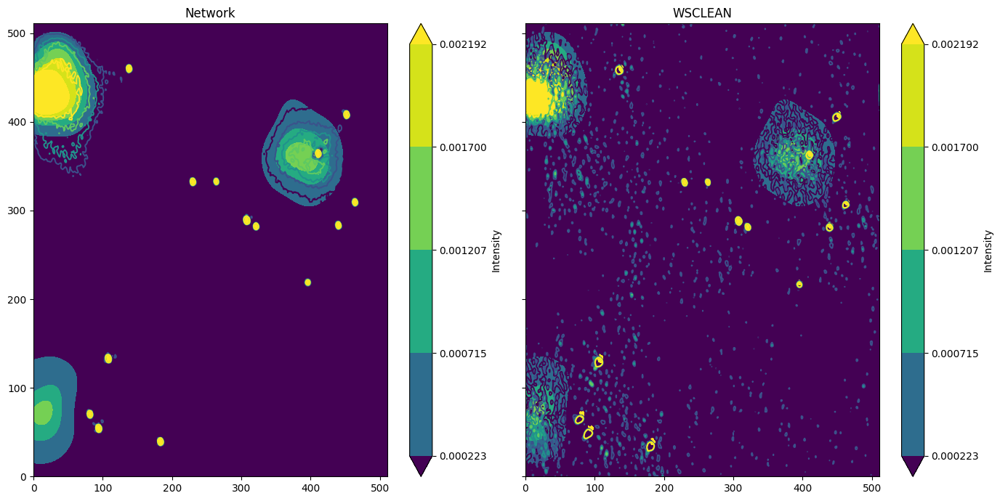

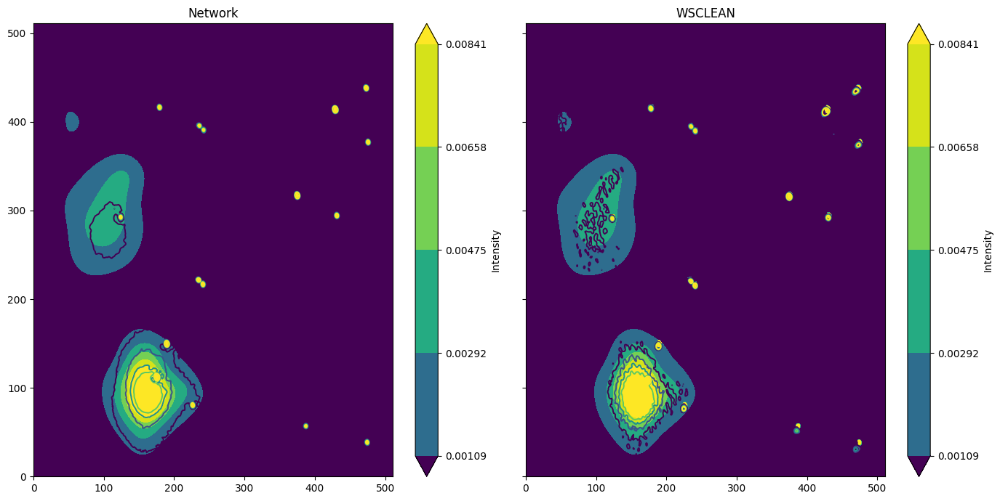

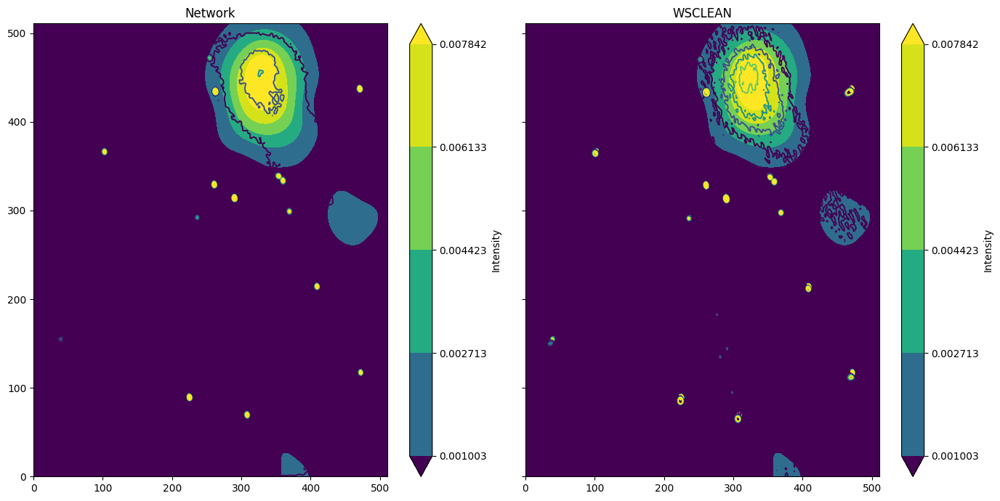

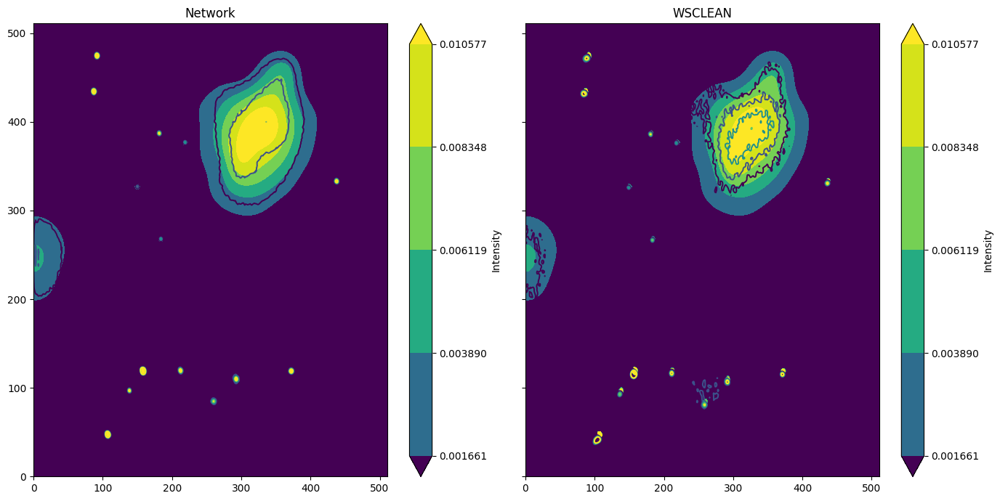

/tmp/ipykernel_141002/4207789249.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(1, 2, figsize=(14, 7), sharex=True, sharey=True)


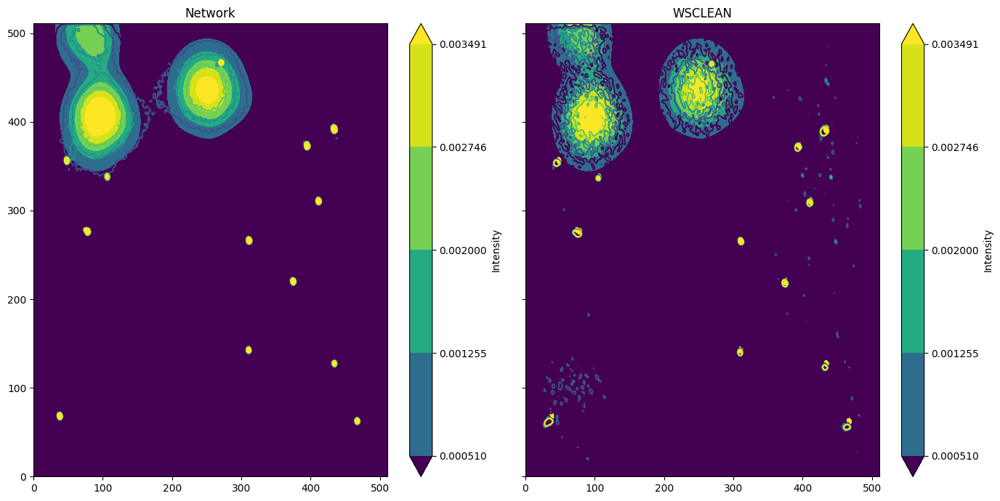

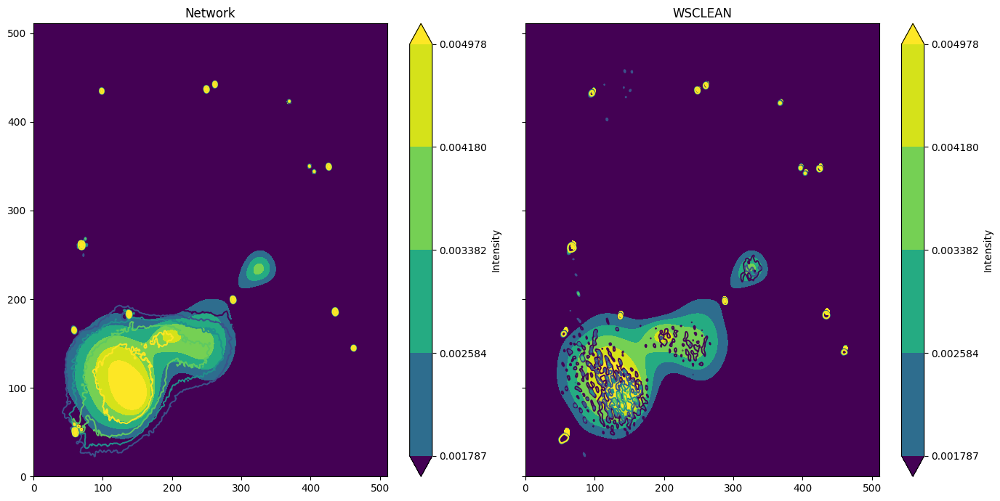

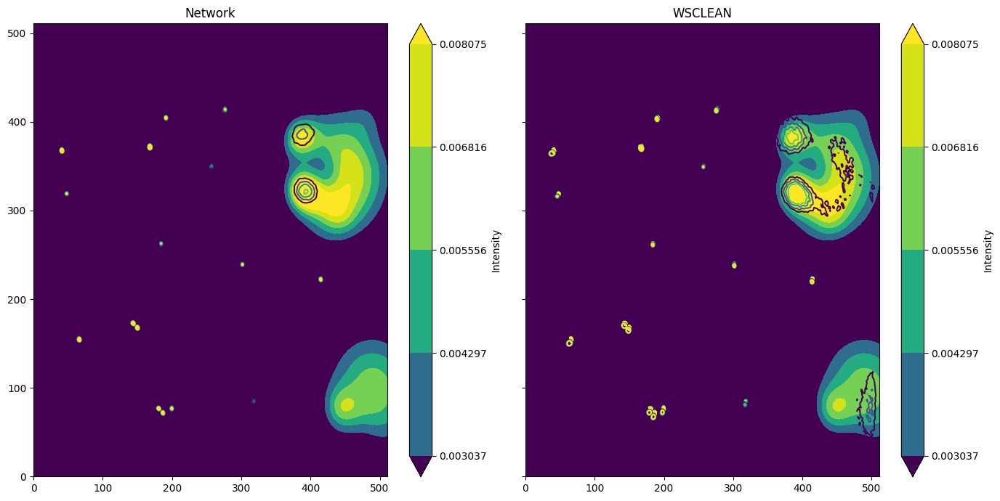

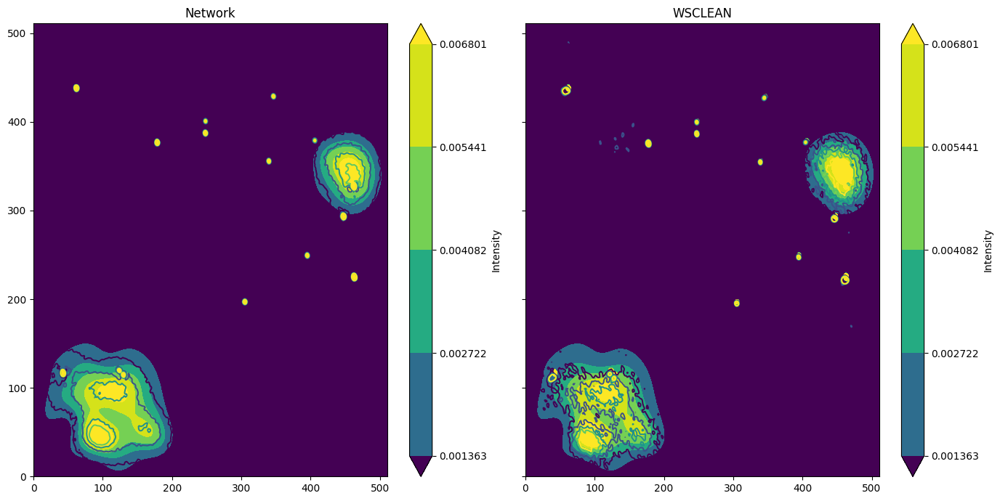

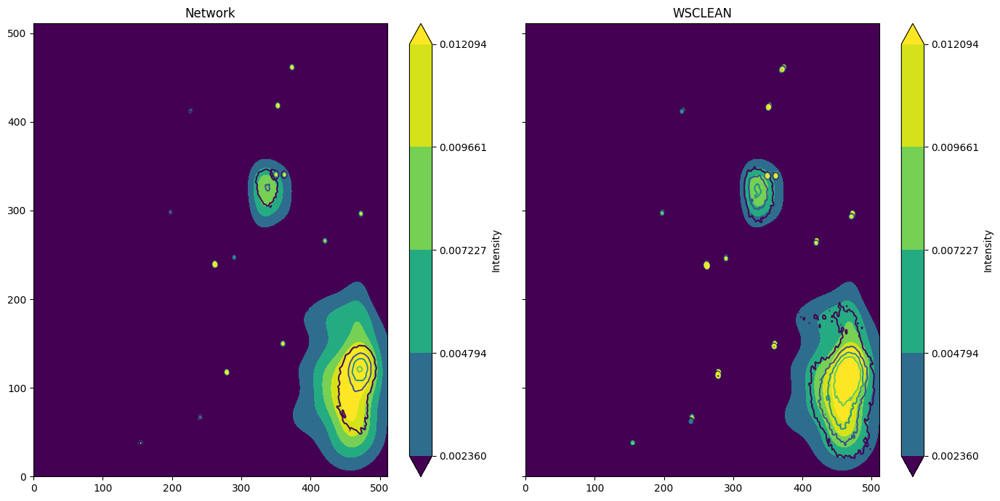

...

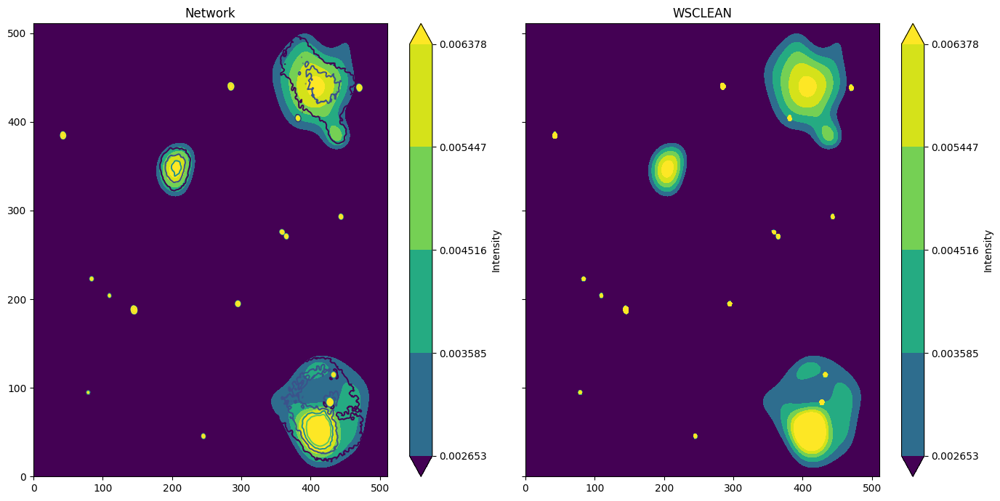

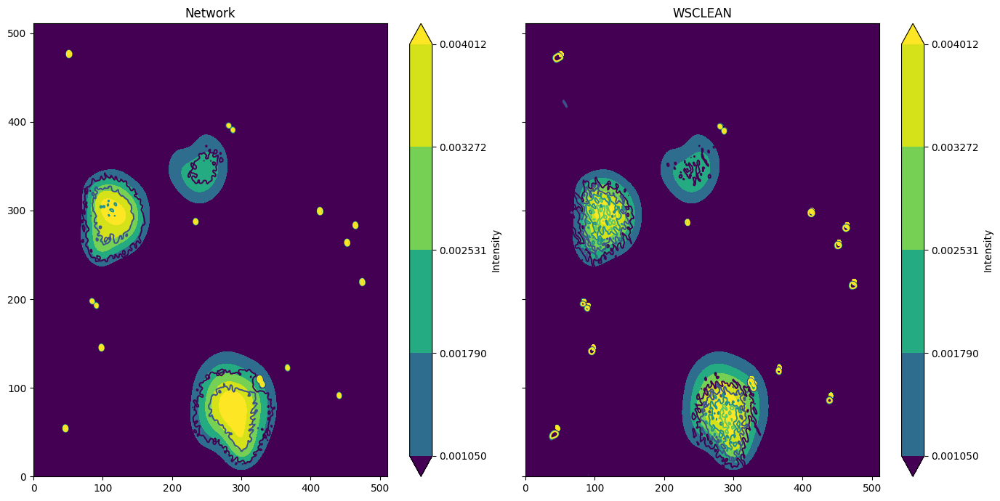

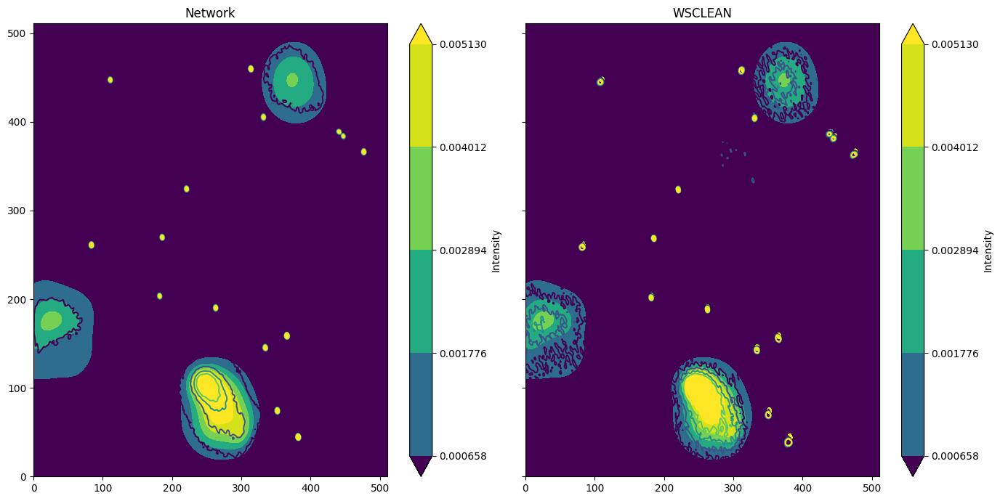

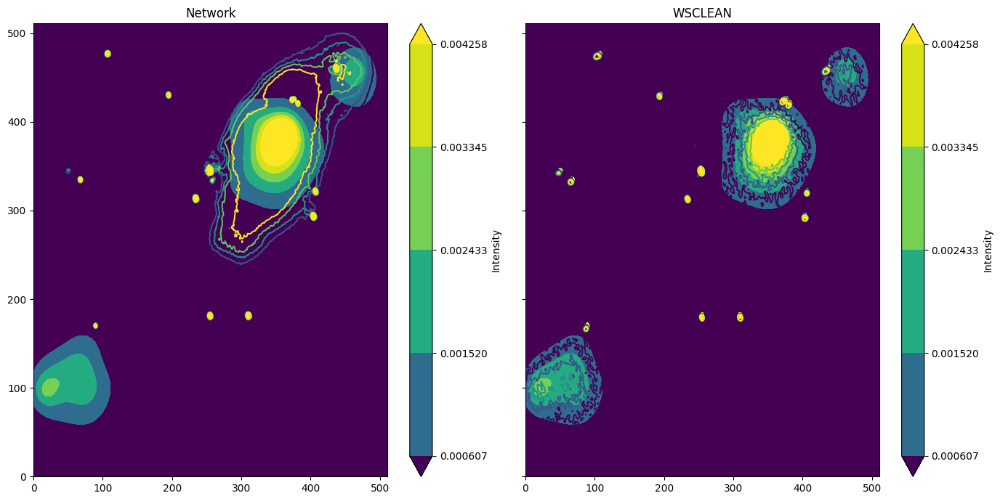

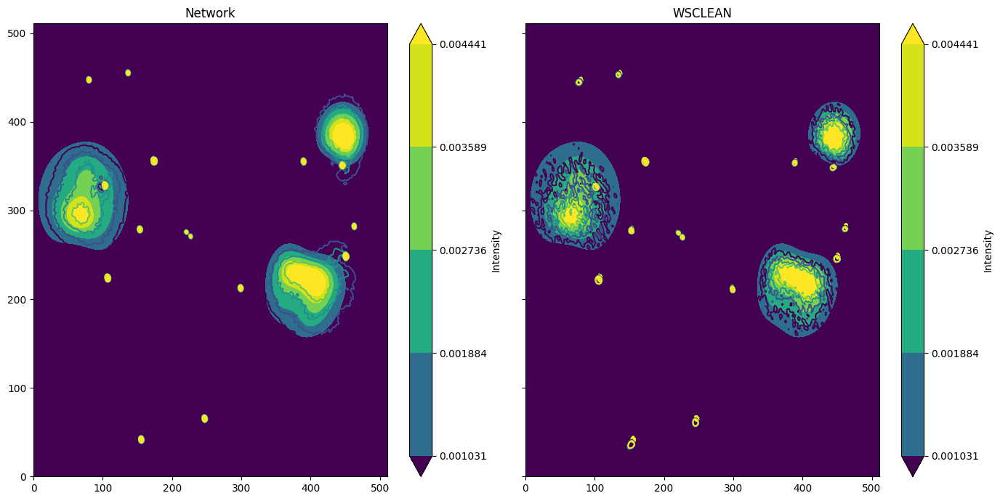

In [12]:
def color_plot(reco_arr, reco_ws_arr, sky_sim_arr):
    for i in range(reco_arr.shape[0]):
        reco = reco_arr[i]
        reco_ws = reco_ws_arr[i]
        sky_sim = sky_sim_arr[i]
        stack = np.stack([reco, reco_ws, sky_sim])

        vmin = np.percentile(stack, 1)
        vmax = np.percentile(stack, 99)

        def normalize(x):
            return np.clip((x - vmin) / (vmax - vmin), 0, 1)

        rgb = np.stack([
            normalize(sky_sim),  # R
            normalize(reco),     # G
            normalize(reco_ws)   # B
        ], axis=-1)

            #plt.figure(figsize=(6, 6))
        plt.imshow(rgb, origin='lower')
        plt.title("RGB (1–99 percentile scaling)")
        plt.savefig("./reconstruction/color_comparison_"+str(i)+".png")
        if i<10:
            plt.show()


def contour_plot(reco_arr, reco_ws_arr, sky_sim_arr):
    for i in range(reco_arr.shape[0]):
        reco = reco_arr[i]
        reco_ws = reco_ws_arr[i]
        sky_sim = sky_sim_arr[i]

        fig, axes = plt.subplots(1, 2, figsize=(14, 7), sharex=True, sharey=True)

        # gemeinsame Level (wichtig für Vergleichbarkeit!)
        levels = np.linspace(
            np.percentile(sky_sim, 90),
            np.percentile(sky_sim, 99),
            5
        )

        # ---------- LEFT: Simulation (filled) + Reco ----------
        cf0 = axes[0].contourf(
            sky_sim,
            levels=levels,
            cmap='viridis',
            norm=PowerNorm(0.5),
            extend='both'
        )

        axes[0].contour(
            reco,
            levels=levels,
            cmap='viridis',
            linewidths=1.4
        )

        axes[0].set_title("Network")

        # ---------- RIGHT: Simulation (filled) + Reco_ws ----------
        cf1 = axes[1].contourf(
            sky_sim,
            levels=levels,
            cmap='viridis',
            norm=PowerNorm(0.5),
            extend='both'
        )

        axes[1].contour(
            reco_ws,
            levels=levels,
            cmap='viridis',
            linewidths=1.4
        )

        axes[1].set_title("WSCLEAN")

        # ---------- Colorbar ----------
        cbar = fig.colorbar(cf1)
        cbar.set_label("Intensity")
        cbar2 = fig.colorbar(cf0)
        cbar2.set_label("Intensity")

        plt.tight_layout()
        plt.savefig("./reconstruction/contour_comparison_"+str(i)+".png")
        if i<10:
            plt.show()

color_plot(reco_arr, reco_ws_arr, sky_sim_arr)
contour_plot(reco_arr, reco_ws_arr, sky_sim_arr)